## Домашнее задание: "Детекция объектов на изображении"

ФИО: Лыжин Роман Денисович

## Цель задания:

Научиться самостоятельно решать задачу детекции.

## Описание задания:

В рамках данного домашнего задания предлагается решить задачу детекции мячей и настроить полный пайплайн обучения модели.



Процесс выполнения задания следующий:



0. Выбор модели детекции для обучения:

    1. Выберите модель детекции для выполнения домашнего задания. Любую, кроме RetinaNet. Ее реализацию можно взять из открытых источников. Модель можно брать предобученную ( в этом случае в пункте 4. показать влияние предобучения на финальное качество).

    2. Полезные ссылки: [PyTorch Vision Models](https://pytorch.org/vision/stable/models.html) (блок Object Detection), [SOTA модели детекции](https://paperswithcode.com/sota/object-detection-on-coco), [Возможный пример кода](https://github.com/AlekseySpasenov/dl-course/blob/autumn_2023/lecture8/detection_example/pytorch_detection_workshop.ipynb)



1. Подготовка обучающего набора данных

    1. Реализуйте корректный класс Dataset и Dataloader для выбранной модели (должен работать форвард вашей модели на том, что выходит из даталоадера) **0.5 балла**.

    2. Добавьте простые аугментации в датасет (аугментации, не затрагивающие изменение ground-truth bounding box) **0.5 балла**.

    3. Внедрите сложные аугментации (аугментации, затрагивающие изменение ground-truth bounding box. Например, аффинные преобразования: сдвиг, поворот и т.д.) **0.5 балла**.



    4. Полезные ссылки: https://pytorch.org/vision/stable/transforms.html , https://albumentations.ai



2. Реализация корректного train-loop и обучение модели:  

    1. Реализуйте эффективный train-loop для вашей модели и проведите обучение **2 балла**.

    2. Выполните несколько запусков обучения с различными параметрами, например: сравните влияние различных аугментаций, оцените влияние того была предобучена модель или нет, сравните результаты при изменении гиперпараметров итд (на ваш выбор) **0.5 балла**.



3. Валидация обученных моделей на тестовой выборке, вычисление метрики mAP

    1. Оцените качество моделей на тестовой части данных и рассчитайте метрику mAP **0.5 балл**

    2. Полезные ссылки: [mean_average_precision](https://github.com/bes-dev/mean_average_precision)



4. Выводы **0.5 балл**:

    1. Проанализируйте результаты обучения, визуально оцените качество работы модели.

    2. Прокомментируйте распространенные ошибки модели и предложите пути для улучшения финального решения.

In [ ]:
!pip install ultralytics
!pip install mean_average_precision

In [ ]:
!pip install roboflow

In [4]:
from roboflow import Roboflow
rf = Roboflow(api_key="kXyXFebCGCm1ZFwI8f0h")
project = rf.workspace("test-workspace-re3cc").project("ball_tracker-vqu2k")
version = project.version(1)
dataset = version.download("yolov11")

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Ball_Tracker-1 in yolov11:: 100%|██████████| 1338/1338 [00:00<00:00, 7236.16it/s]


In [5]:
project = rf.workspace("iqiq").project("ballonly")
version = project.version(1)
dataset = version.download("yolov11")

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to ballonly-1 in yolov11:: 100%|██████████| 1729/1729 [00:00<00:00, 7170.69it/s]


In [6]:
project = rf.workspace("new-workspace-va9vn").project("balls-detection")
version = project.version(1)
dataset = version.download("yolov11")

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to balls-detection-1 in yolov11:: 100%|██████████| 1642/1642 [00:00<00:00, 4517.91it/s]


In [7]:
import shutil
import os

dataset_paths = [
    "balls-detection-1", 
    "ballonly-1",        
    "Ball_Tracker-1"      
]

merged_paths = {
    'train': "merged_dataset/train",
    'valid': "merged_dataset/valid",
    'test': "merged_dataset/test"
}

class_mapping = {
    'Balls': 0,
    'ball': 1,
    'sports ball': 2
}

for split in ['train', 'valid', 'test']:
    os.makedirs(os.path.join(merged_paths[split], 'images'), exist_ok=True)
    os.makedirs(os.path.join(merged_paths[split], 'labels'), exist_ok=True)

for dataset in dataset_paths:
    for split in ['train', 'valid']:
        images_src = os.path.join(dataset, split, 'images')
        labels_src = os.path.join(dataset, split, 'labels')

        images_dst = os.path.join(merged_paths[split], 'images')
        labels_dst = os.path.join(merged_paths[split], 'labels')

        if os.path.exists(images_src):
            for img_file in os.listdir(images_src):
                shutil.copy(os.path.join(images_src, img_file), images_dst)

        if os.path.exists(labels_src):
            for lbl_file in os.listdir(labels_src):
                with open(os.path.join(labels_src, lbl_file), 'r') as file:
                    lines = file.readlines()

                with open(os.path.join(labels_dst, lbl_file), 'w') as file:
                    for line in lines:
                        parts = line.split()
                        class_name = parts[0]
                        if class_name in class_mapping:
                            new_class_id = class_mapping[class_name]
                            parts[0] = str(new_class_id) 
                        file.write(" ".join(parts) + "\n")

for dataset in dataset_paths:
    for split in ['test']:
        images_src = os.path.join(dataset, split, 'images')
        labels_src = os.path.join(dataset, split, 'labels')

        if os.path.exists(images_src):
            for img_file in os.listdir(images_src):
                shutil.copy(os.path.join(images_src, img_file), merged_paths[split] + '/images/')

        if os.path.exists(labels_src):
            for lbl_file in os.listdir(labels_src):
                with open(os.path.join(labels_src, lbl_file), 'r') as file:
                    lines = file.readlines()

                with open(os.path.join(merged_paths[split], 'labels', lbl_file), 'w') as file:
                    for line in lines:
                        parts = line.split()
                        class_name = parts[0]
                        if class_name in class_mapping:
                            new_class_id = class_mapping[class_name]
                            parts[0] = str(new_class_id)
                        file.write(" ".join(parts) + "\n")

In [8]:
import yaml

# Для простых аугментаций
simple_aug = {
    'train': '/kaggle/working/merged_dataset/train/images',
    'val': '/kaggle/working/merged_dataset/valid/images',
    'test': '/kaggle/working/merged_dataset/test/images',
    'nc': 3,
    'names': ['Balls', 'ball', 'sports ball'],
    'augmentations': [
        {'flipud': 0.5},
        {'fliplr': 0.5},
        {'hsv_hue': 0.1},
        {'hsv_saturation': 0.1},
        {'hsv_value': 0.1}
    ]
}

# Для сложных аугментаций
complex_aug = {
    'train': '/kaggle/working/merged_dataset/train/images',
    'val': '/kaggle/working/merged_dataset/valid/images',
    'test': '/kaggle/working/merged_dataset/test/images',
    'nc': 3,
    'names': ['Balls', 'ball', 'sports ball'],
    'augmentations': [
        {'flipud': 0.5},
        {'fliplr': 0.5},
        {'hsv_hue': 0.1},
        {'hsv_saturation': 0.1},
        {'hsv_value': 0.1},
        {'rotate': 0.5},
        {'shift': 0.5},
        {'scale': 0.5},
        {'shear': 0.5}
    ]
}

# Сохранение в файлы YAML
with open('merged_dataset/data_simple_aug.yml', 'w') as f:
    yaml.dump(simple_aug, f)

with open('merged_dataset/data_complex_aug.yml', 'w') as f:
    yaml.dump(complex_aug, f)

In [9]:
import torch
from ultralytics import YOLO

# Загрузка предобученной модели YOLO11n
model = YOLO("yolo11n.pt")

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)
print(device)

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


100%|██████████| 5.35M/5.35M [00:00<00:00, 177MB/s]

cpu


In [ ]:
model.train(data="merged_dataset/data_simple_aug.yml", epochs=10, imgsz=640, batch=64, augment=True, project='runs/train', name='simple_aug')

In [ ]:
model.train(data="merged_dataset/data_complex_aug.yml", epochs=10, imgsz=640, batch=64, augment=True, project='runs/train', name='complex_aug')

In [ ]:
model_simple = YOLO('runs/train/simple_aug/weights/best.pt')
model_complex = YOLO('runs/train/complex_aug/weights/best.pt')

In [12]:
model_simple = YOLO('/kaggle/input/best-hw6/complex_best.pt')
model_complex = YOLO('/kaggle/input/best-hw6/simple_best.pt')

In [14]:
results_simple = model_simple.val(data='merged_dataset/data_simple_aug.yml', split='test')
results_complex = model_complex.val(data='merged_dataset/data_complex_aug.yml', split='test')

Ultralytics 8.3.32 🚀 Python-3.10.14 torch-2.4.0+cpu CPU (Intel Xeon 2.20GHz)
YOLO11n summary (fused): 238 layers, 2,582,737 parameters, 0 gradients, 6.3 GFLOPs


100%|██████████| 755k/755k [00:00<00:00, 42.5MB/s]
val: Scanning /kaggle/working/merged_dataset/test/labels... 148 images, 1 backgrounds, 0 corrupt: 100%|██████████| 148/148 [00:00<00:00, 879.11it/s]

val: New cache created: /kaggle/working/merged_dataset/test/labels.cache



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:20<00:00,  2.09s/it]


                   all        148        236       0.92      0.915      0.963      0.699
                 Balls        147        236       0.92      0.915      0.963      0.699
Speed: 3.1ms preprocess, 126.2ms inference, 0.0ms loss, 0.7ms postprocess per image
Results saved to runs/detect/val
Ultralytics 8.3.32 🚀 Python-3.10.14 torch-2.4.0+cpu CPU (Intel Xeon 2.20GHz)
YOLO11n summary (fused): 238 layers, 2,582,737 parameters, 0 gradients, 6.3 GFLOPs


val: Scanning /kaggle/working/merged_dataset/test/labels.cache... 148 images, 1 backgrounds, 0 corrupt: 100%|██████████| 148/148 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:20<00:00,  2.06s/it]


                   all        148        236      0.941      0.894      0.945      0.671
                 Balls        147        236      0.941      0.894      0.945      0.671
Speed: 2.9ms preprocess, 125.7ms inference, 0.0ms loss, 1.0ms postprocess per image
Results saved to runs/detect/val2


In [30]:
map50_simple = results_simple.results_dict['metrics/mAP50(B)']
print(f"mAP@0.5 for simple augmentation: {map50_simple}")

map50_95_simple = results_simple.results_dict['metrics/mAP50-95(B)']
print(f"mAP@0.5:0.95 for simple augmentation: {map50_95_simple}")

mAP@0.5 for simple augmentation: 0.9626948916797119
mAP@0.5:0.95 for simple augmentation: 0.6992681585369233


In [31]:
map50_complex = results_complex.results_dict['metrics/mAP50(B)']
print(f"mAP@0.5 for complex augmentation: {map50_complex}")

map50_95_complex = results_complex.results_dict['metrics/mAP50-95(B)']
print(f"mAP@0.5:0.95 for complex augmentation: {map50_95_complex}")

mAP@0.5 for complex augmentation: 0.9452282899453989
mAP@0.5:0.95 for complex augmentation: 0.6705395748631402



image 1/1 /kaggle/working/merged_dataset/test/images/top25_clips_071-084_185_jpg.rf.253dcb77fb66f918ce48ae61afc71ea7.jpg: 384x640 (no detections), 93.6ms
Speed: 2.8ms preprocess, 93.6ms inference, 0.7ms postprocess per image at shape (1, 3, 384, 640)


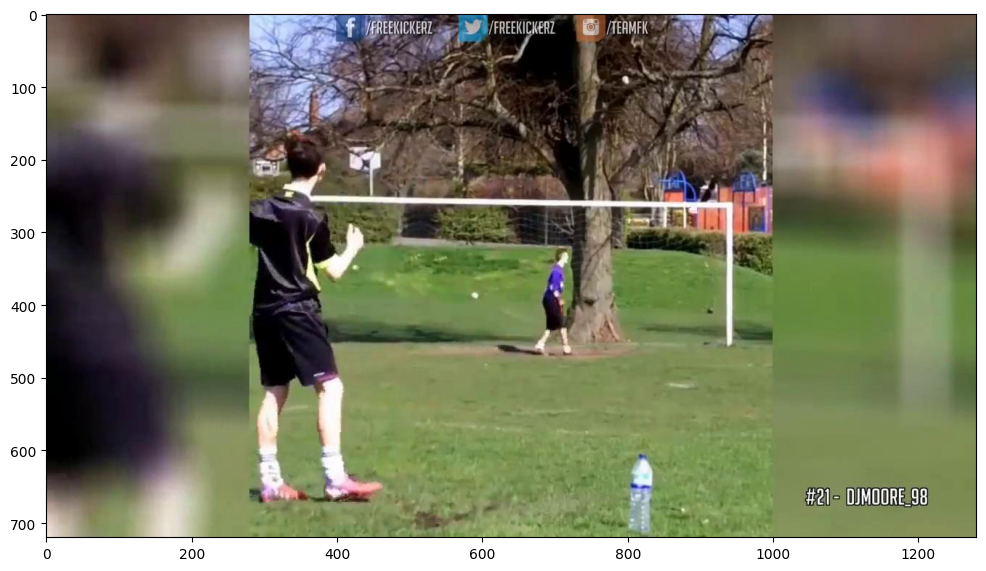


image 1/1 /kaggle/working/merged_dataset/test/images/valid-96-_jpg.rf.00b6c472c4e4d013ac2aef229294f4c9.jpg: 640x640 1 Balls, 137.9ms
Speed: 10.8ms preprocess, 137.9ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


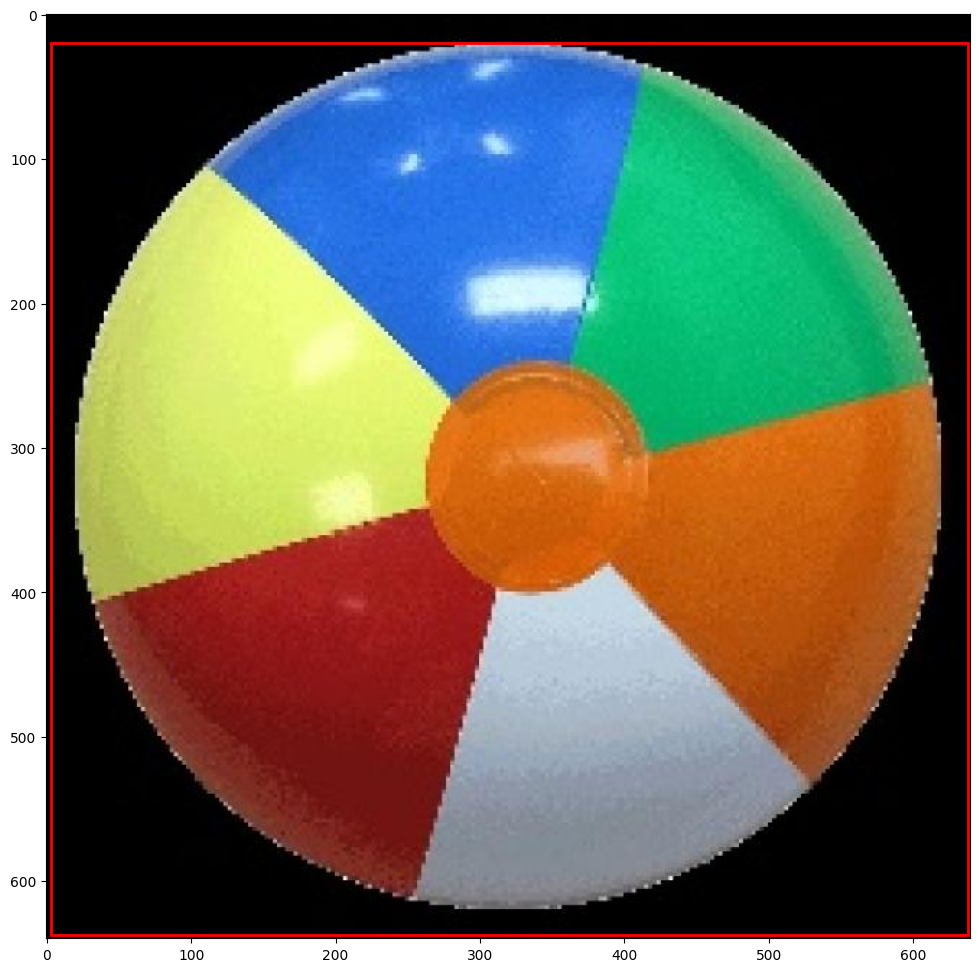


image 1/1 /kaggle/working/merged_dataset/test/images/top25_clips_133-138_104_jpg.rf.357a45c0b465eeda6f71ae750664f2e8.jpg: 384x640 (no detections), 83.4ms
Speed: 1.9ms preprocess, 83.4ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)


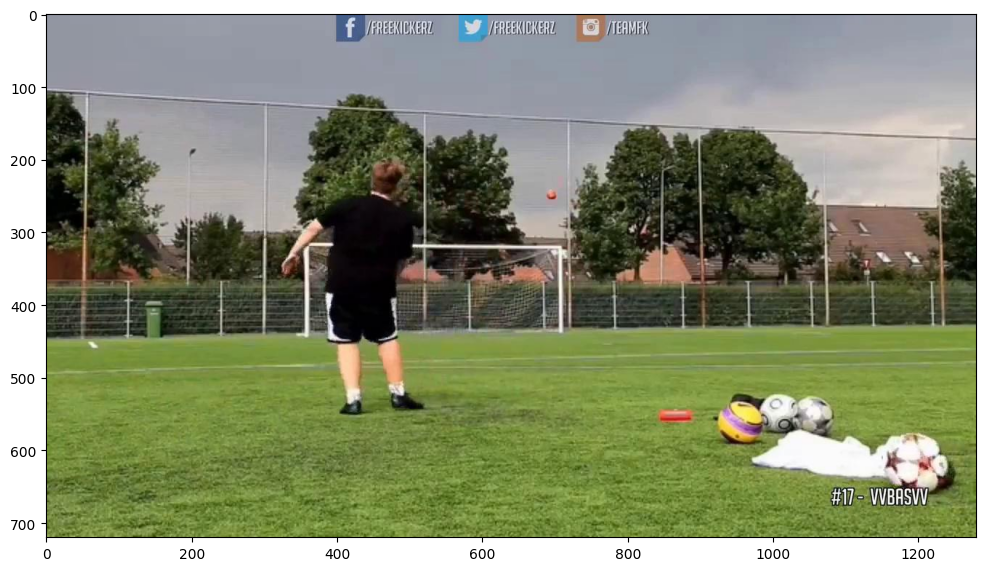


image 1/1 /kaggle/working/merged_dataset/test/images/1-180-_jpg.rf.69be503cd569c95c719760e60f8e4364.jpg: 640x640 6 Ballss, 123.1ms
Speed: 1.9ms preprocess, 123.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


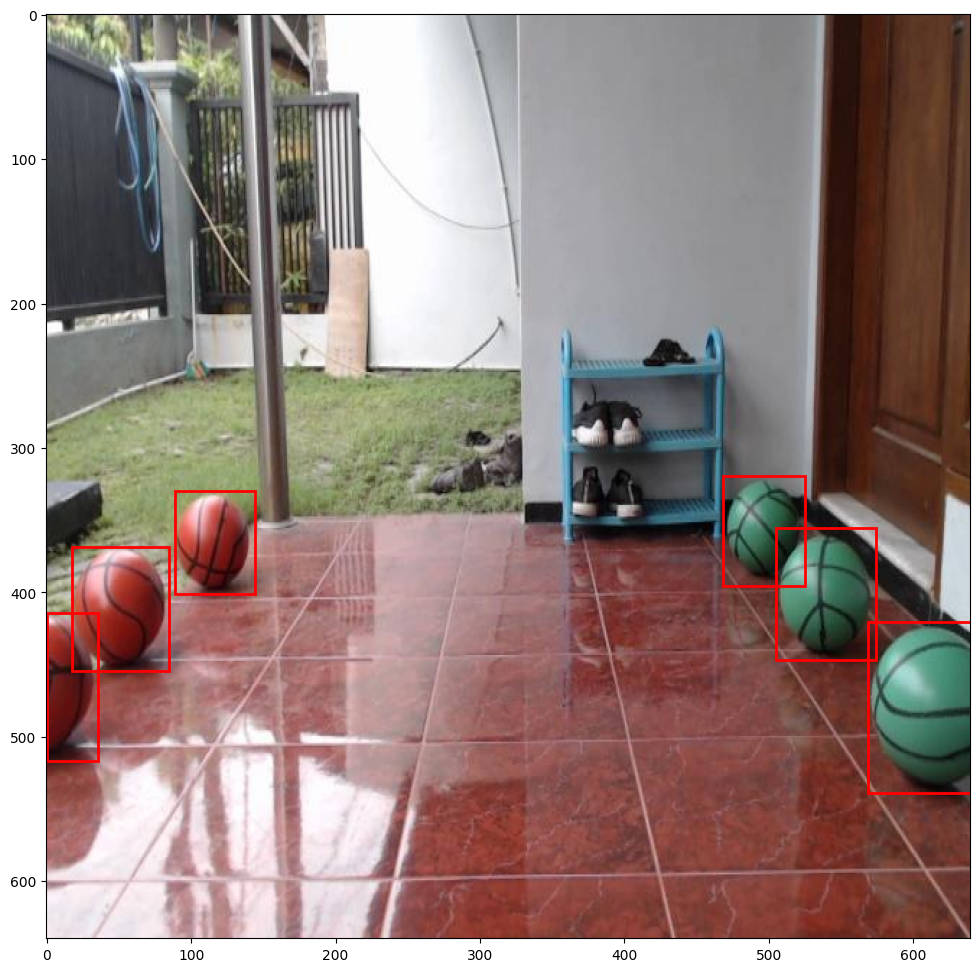


image 1/1 /kaggle/working/merged_dataset/test/images/valid-279-_jpg.rf.67edfca3fc63cb05d232c34480a52d13.jpg: 640x640 1 Balls, 119.2ms
Speed: 2.5ms preprocess, 119.2ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)


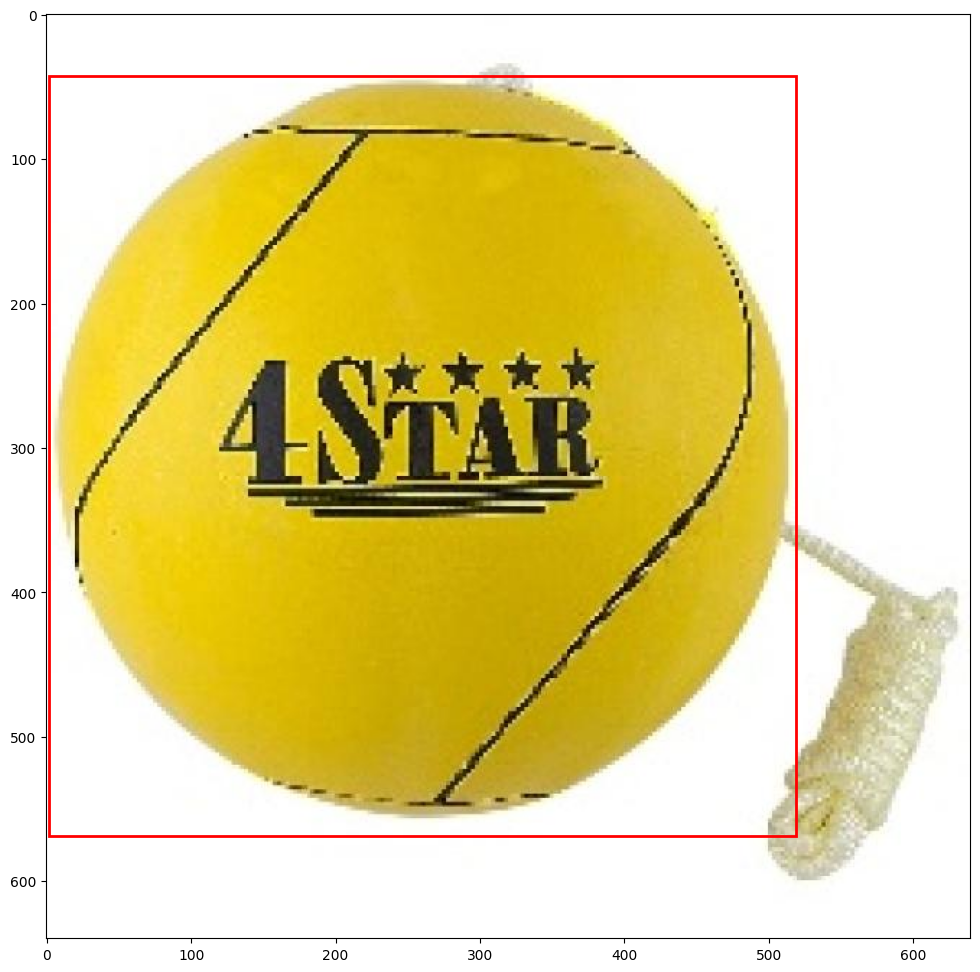


image 1/1 /kaggle/working/merged_dataset/test/images/1-247-_jpg.rf.02a74e220bd6d89bd1fccbb79905fe03.jpg: 640x640 3 Ballss, 125.4ms
Speed: 1.9ms preprocess, 125.4ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


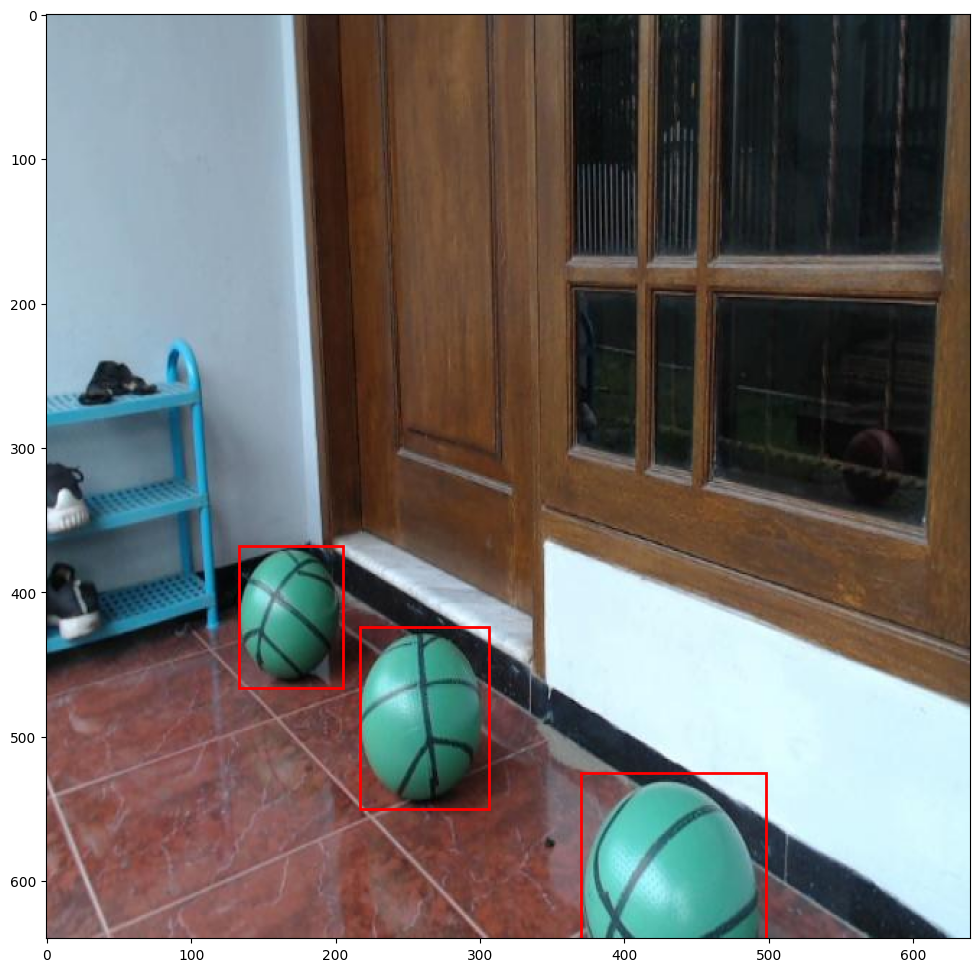


image 1/1 /kaggle/working/merged_dataset/test/images/framec47_jpg.rf.f0380d32ebd114c0ed0ffd5685b68bf1.jpg: 384x640 3 Ballss, 82.7ms
Speed: 3.6ms preprocess, 82.7ms inference, 0.8ms postprocess per image at shape (1, 3, 384, 640)


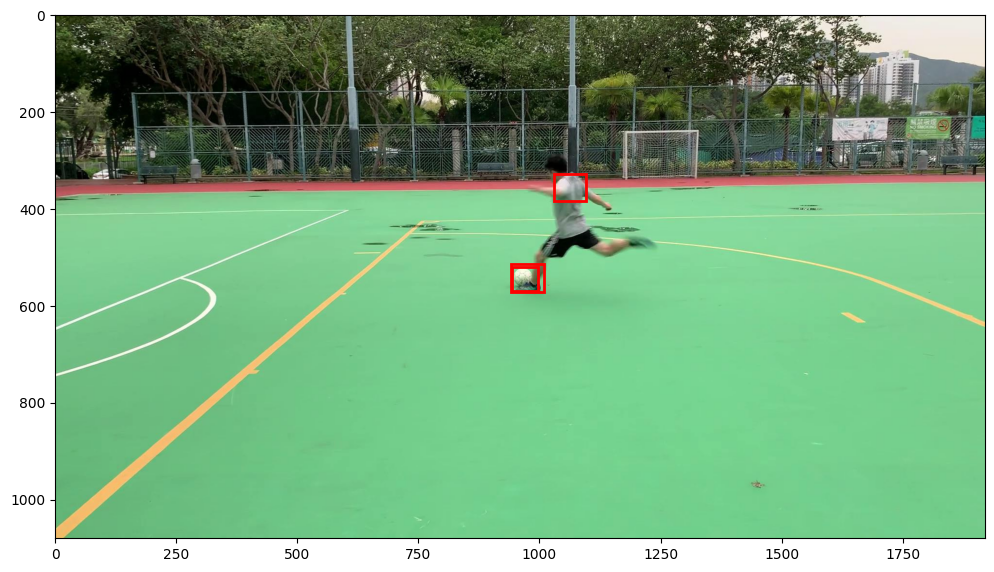


image 1/1 /kaggle/working/merged_dataset/test/images/1-198-_jpg.rf.173fb350ffa394e4f830e8cb85793e89.jpg: 640x640 3 Ballss, 123.9ms
Speed: 1.9ms preprocess, 123.9ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)


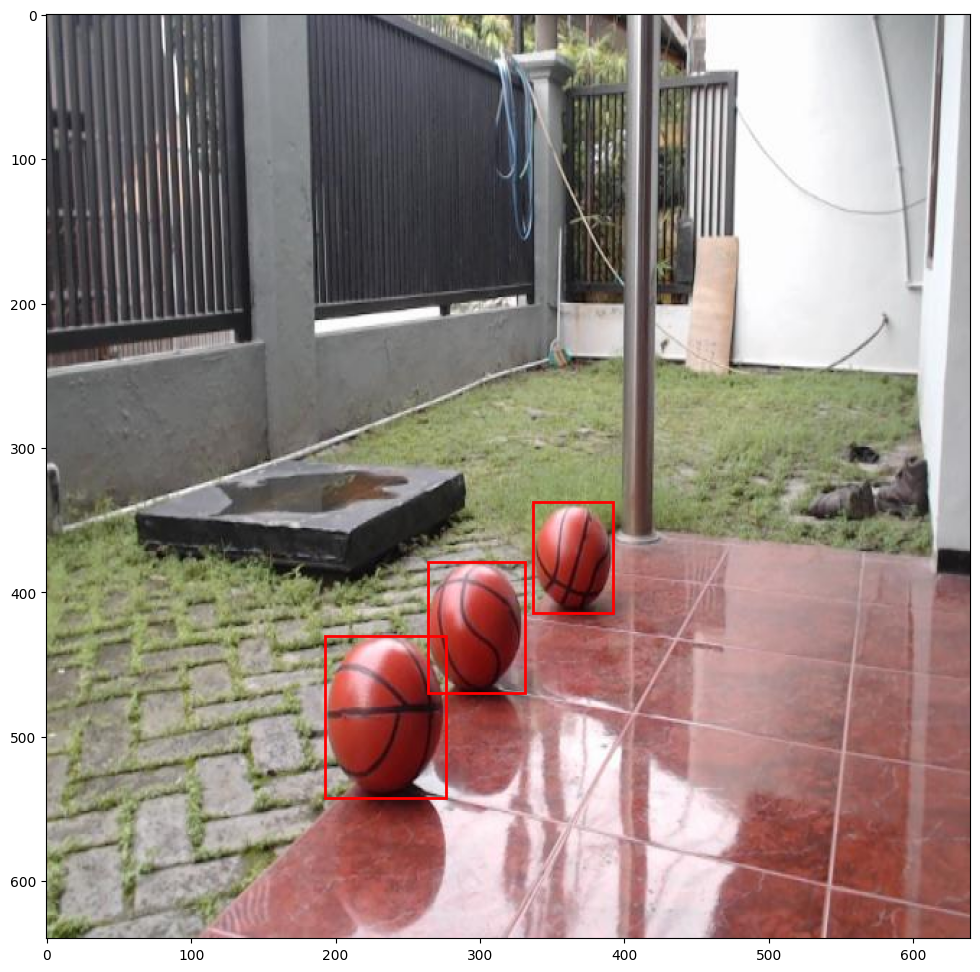


image 1/1 /kaggle/working/merged_dataset/test/images/1-1098-_jpg.rf.7bf76b5855b9fb66fbf4ad092eba798a.jpg: 640x640 3 Ballss, 122.6ms
Speed: 1.9ms preprocess, 122.6ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)


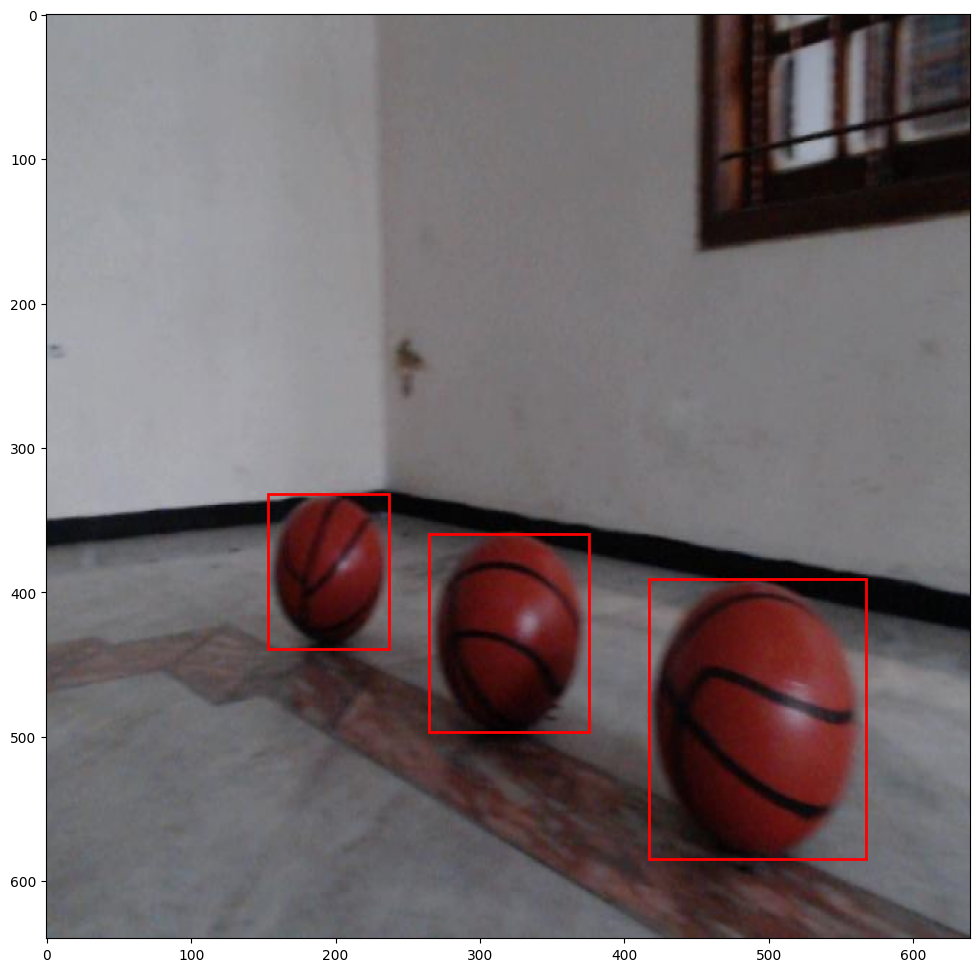


image 1/1 /kaggle/working/merged_dataset/test/images/top25_clips_071-084_176_jpg.rf.5587e695be31872d65cd99814bf82b72.jpg: 384x640 1 Balls, 83.8ms
Speed: 1.9ms preprocess, 83.8ms inference, 0.8ms postprocess per image at shape (1, 3, 384, 640)


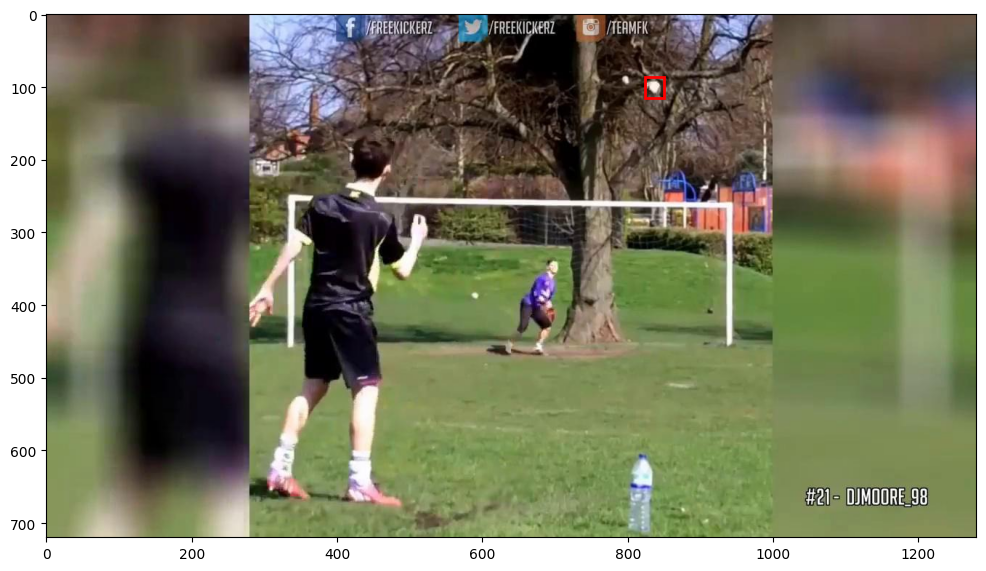


image 1/1 /kaggle/working/merged_dataset/test/images/top25_clips_102-117_39_jpg.rf.dfd99fa7d1b0e5725cc0025fe3fa1af3.jpg: 384x640 1 Balls, 78.4ms
Speed: 2.2ms preprocess, 78.4ms inference, 0.8ms postprocess per image at shape (1, 3, 384, 640)


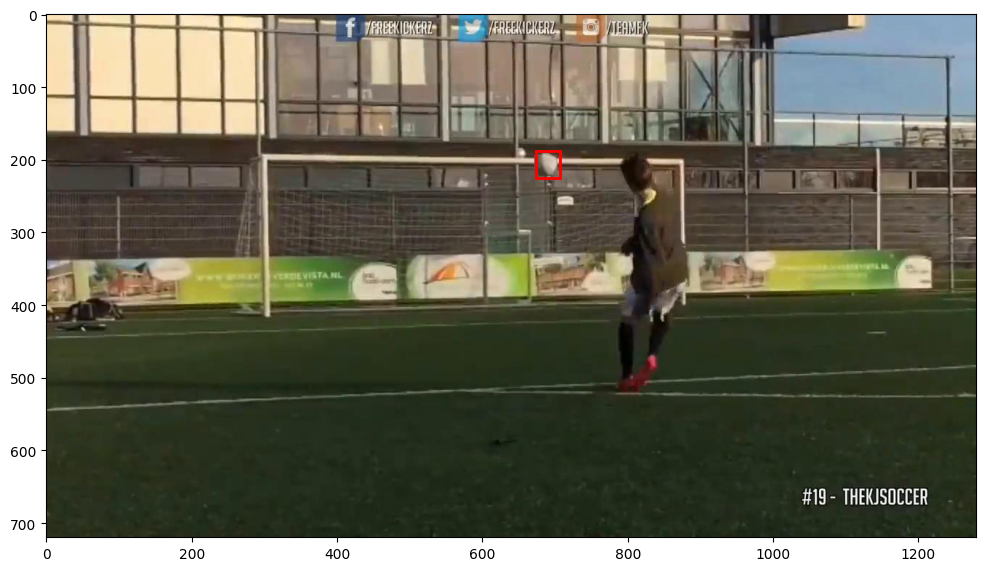


image 1/1 /kaggle/working/merged_dataset/test/images/1-1-_jpg.rf.04542d5dbb6555f87baef1bdfcad109f.jpg: 640x640 2 Ballss, 117.6ms
Speed: 2.5ms preprocess, 117.6ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)


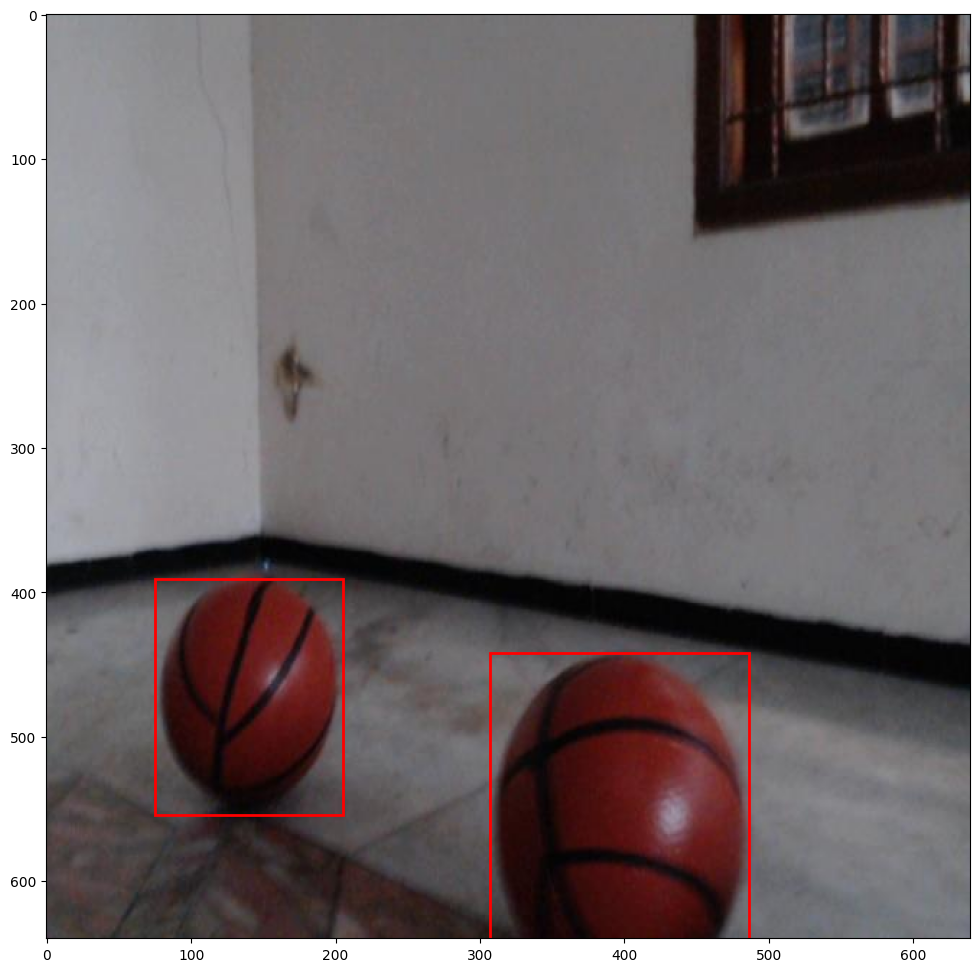


image 1/1 /kaggle/working/merged_dataset/test/images/valid-231-_jpg.rf.547631725933543e047783c81827d34e.jpg: 640x640 1 Balls, 123.0ms
Speed: 1.9ms preprocess, 123.0ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)


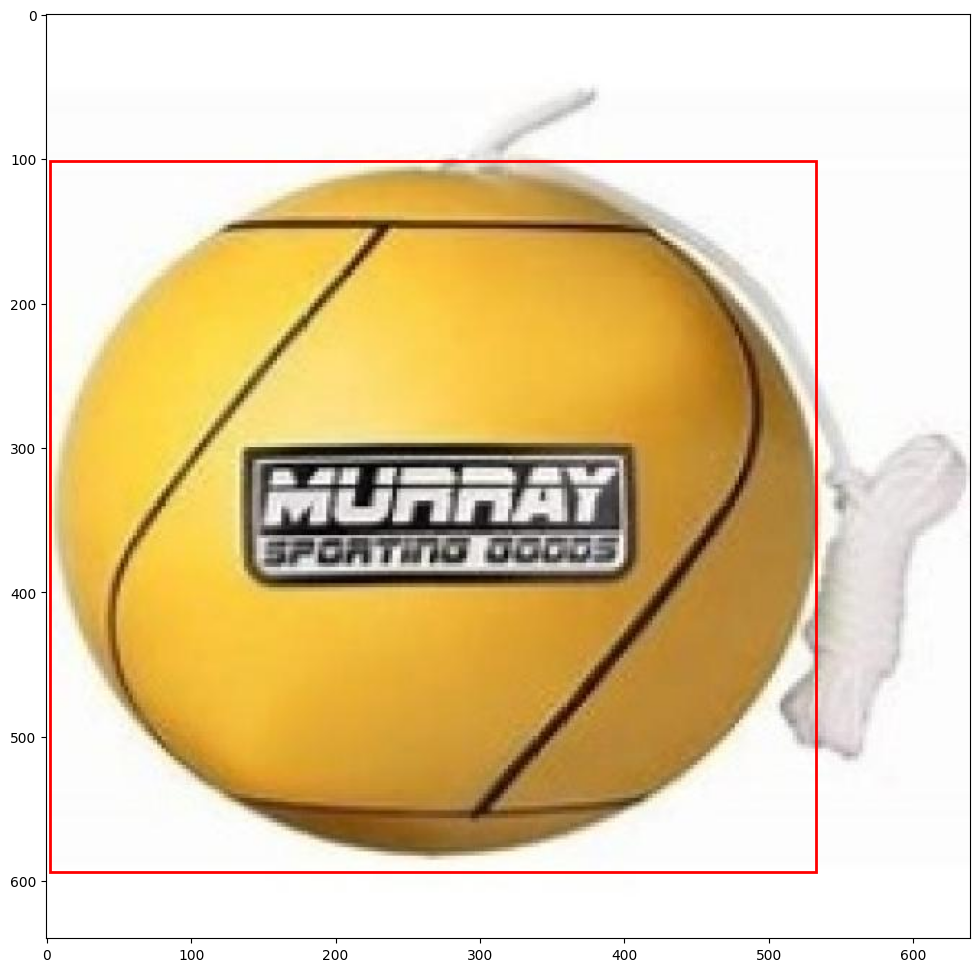


image 1/1 /kaggle/working/merged_dataset/test/images/1-1054-_jpg.rf.6e02aea159c73165598ab3bada747fd3.jpg: 640x640 3 Ballss, 122.0ms
Speed: 1.9ms preprocess, 122.0ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)


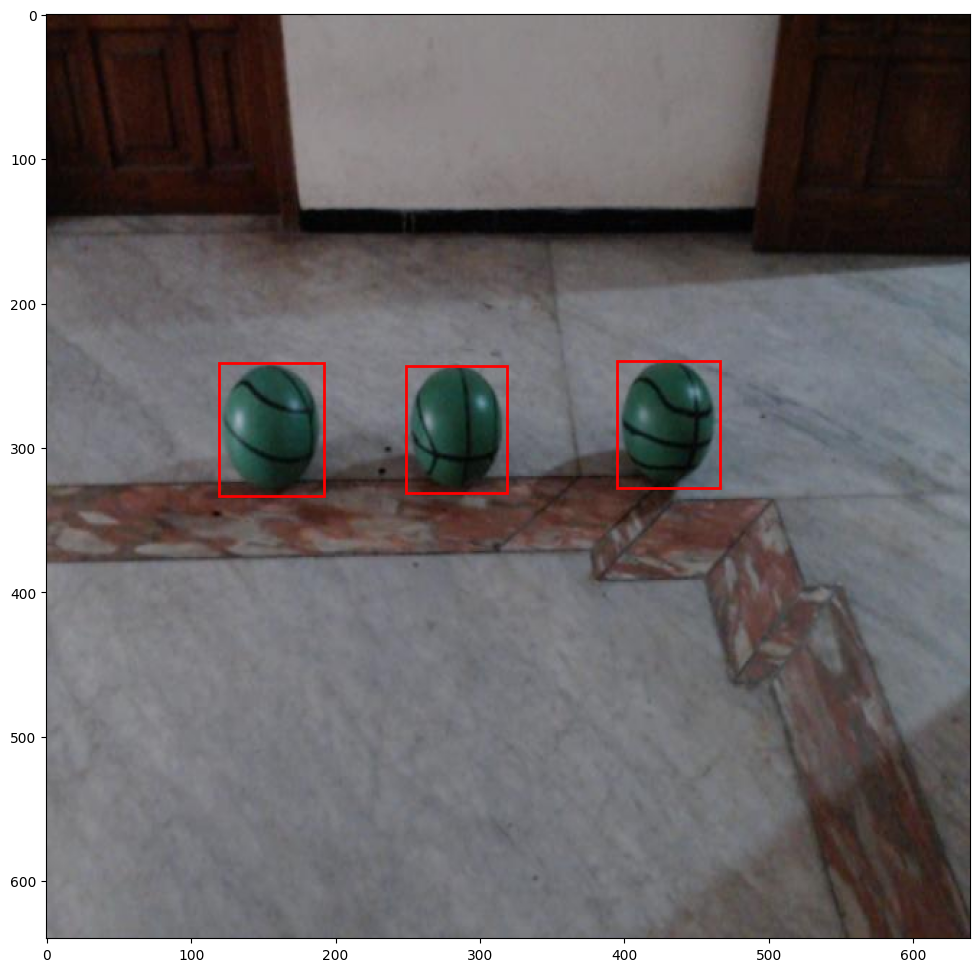


image 1/1 /kaggle/working/merged_dataset/test/images/1-115-_jpg.rf.12210a166b430c7e118a9673ff6d1487.jpg: 640x640 3 Ballss, 124.6ms
Speed: 1.9ms preprocess, 124.6ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


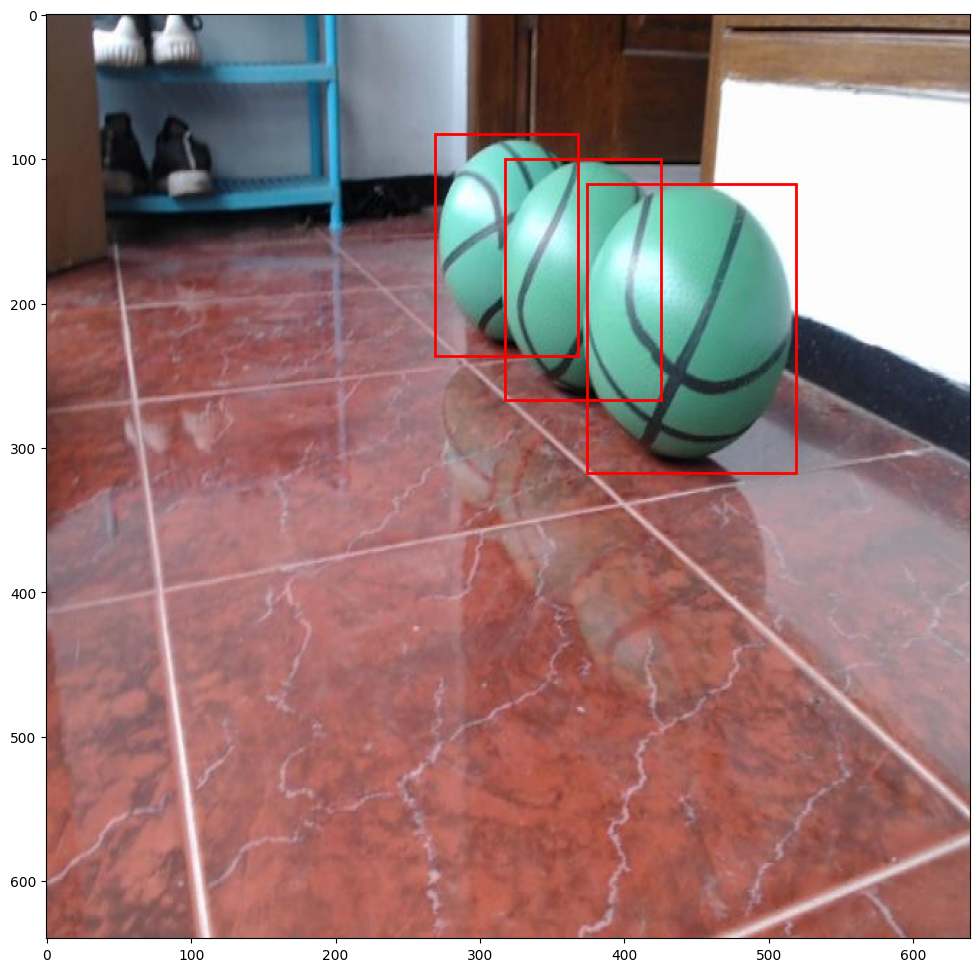


image 1/1 /kaggle/working/merged_dataset/test/images/1-259-_jpg.rf.f58c3ea6cfc5c018269cac7cf698405c.jpg: 640x640 2 Ballss, 123.4ms
Speed: 1.9ms preprocess, 123.4ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)


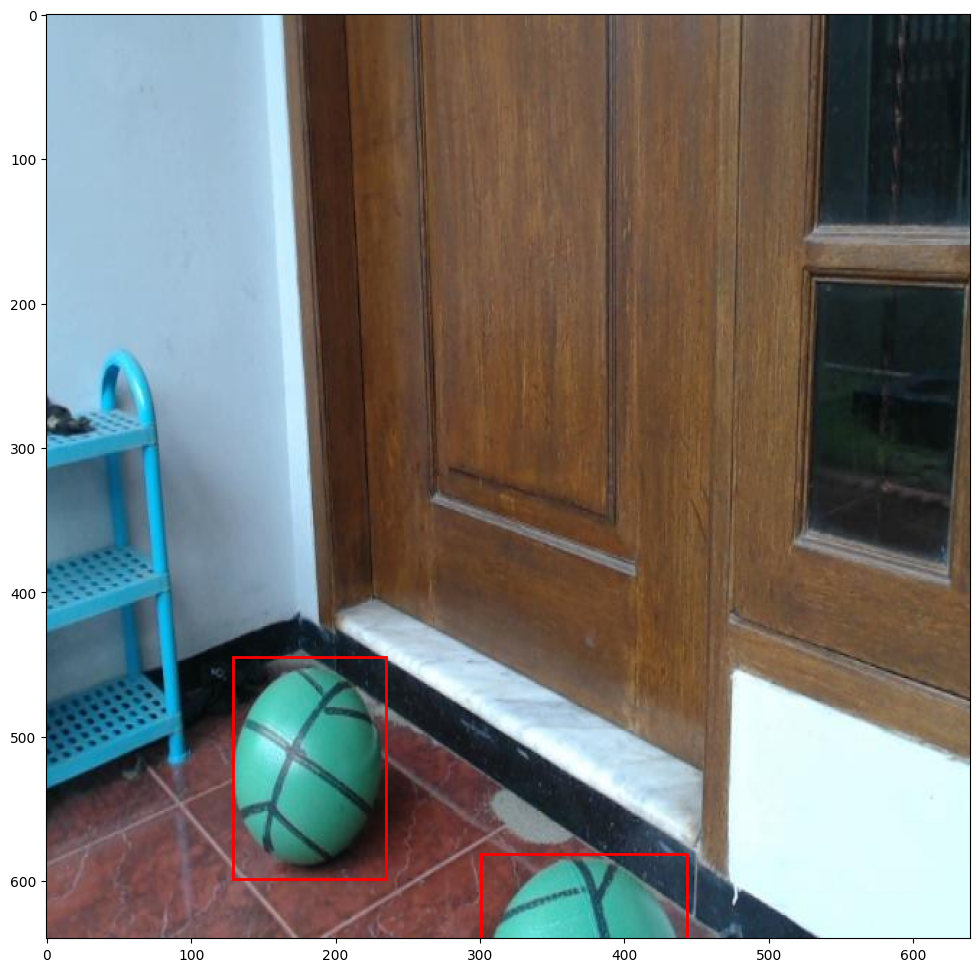


image 1/1 /kaggle/working/merged_dataset/test/images/1-177-_jpg.rf.6f0791400674556a5a0967beb01203fc.jpg: 640x640 6 Ballss, 123.9ms
Speed: 1.9ms preprocess, 123.9ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)


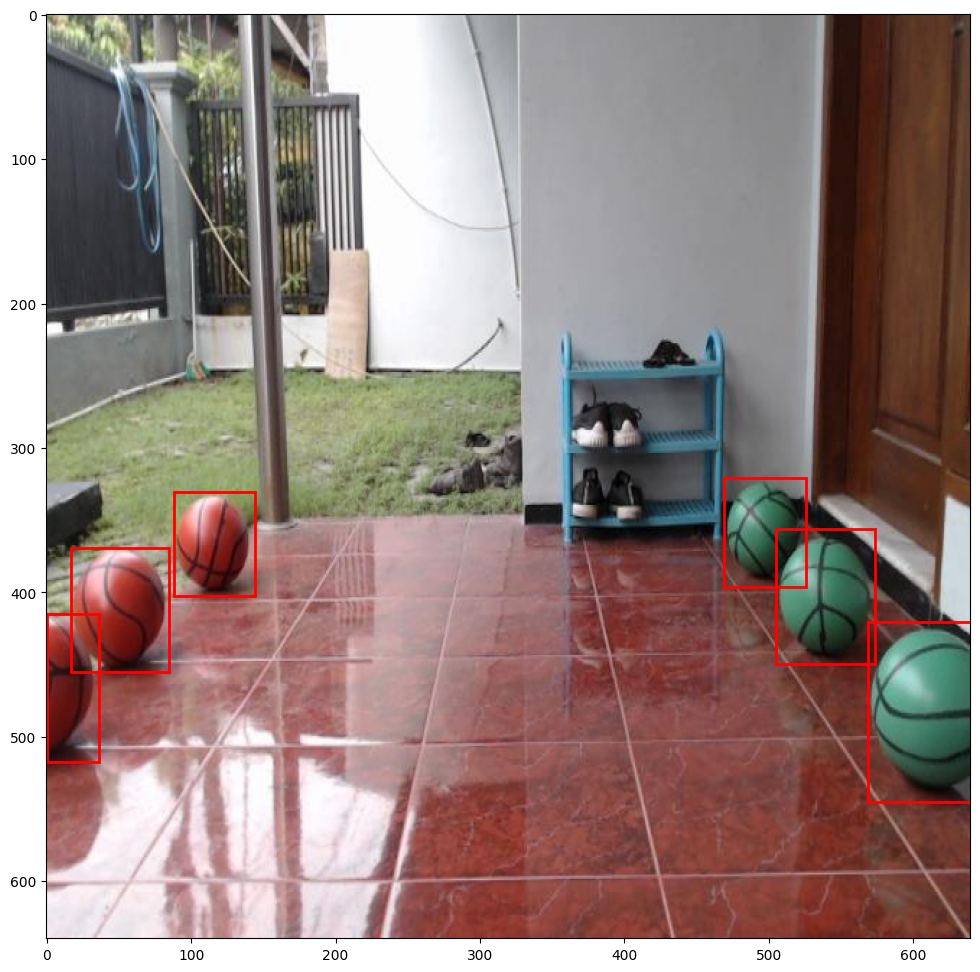


image 1/1 /kaggle/working/merged_dataset/test/images/top25_clips_102-117_347_jpg.rf.238077edfe87e94b136239f77e487b0c.jpg: 384x640 2 Ballss, 83.9ms
Speed: 2.0ms preprocess, 83.9ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)


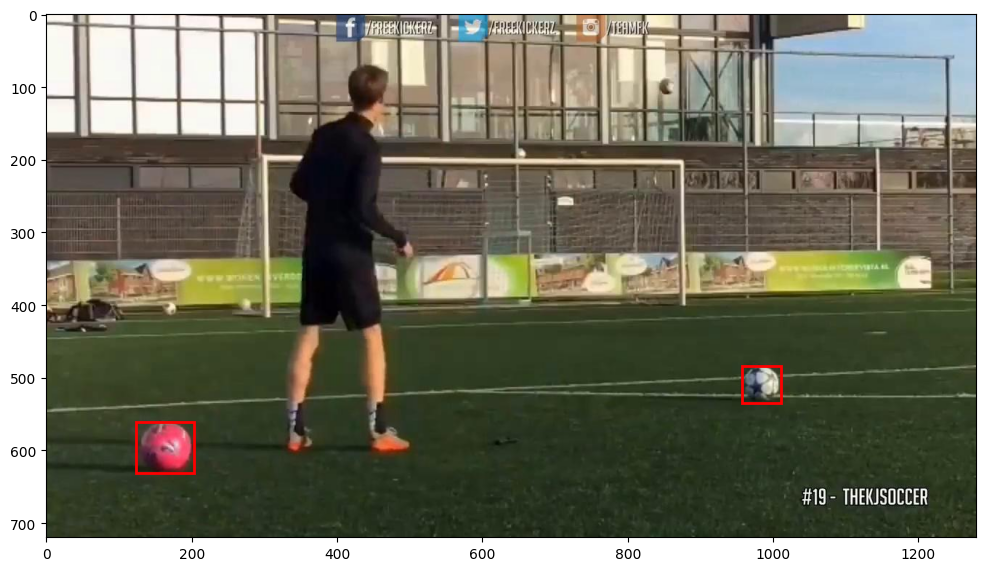


image 1/1 /kaggle/working/merged_dataset/test/images/top25_clips_031-038_107_jpg.rf.304f2625cf6565a147180350c5edb6f1.jpg: 384x640 1 Balls, 79.7ms
Speed: 2.4ms preprocess, 79.7ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)


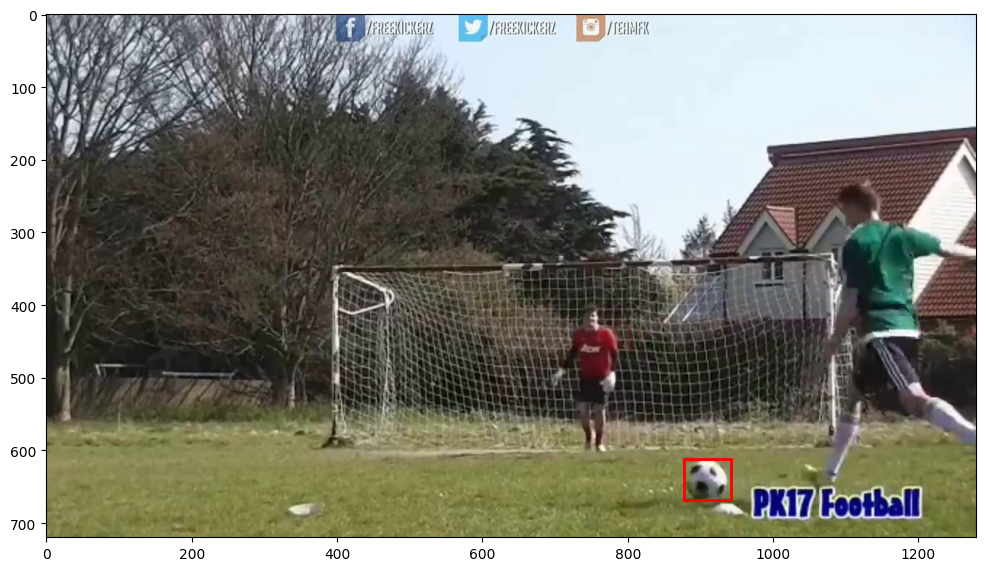


image 1/1 /kaggle/working/merged_dataset/test/images/top25_clips_102-117_44_jpg.rf.2f73eeb19995bc043a538372e7013541.jpg: 384x640 1 Balls, 83.2ms
Speed: 1.9ms preprocess, 83.2ms inference, 0.8ms postprocess per image at shape (1, 3, 384, 640)


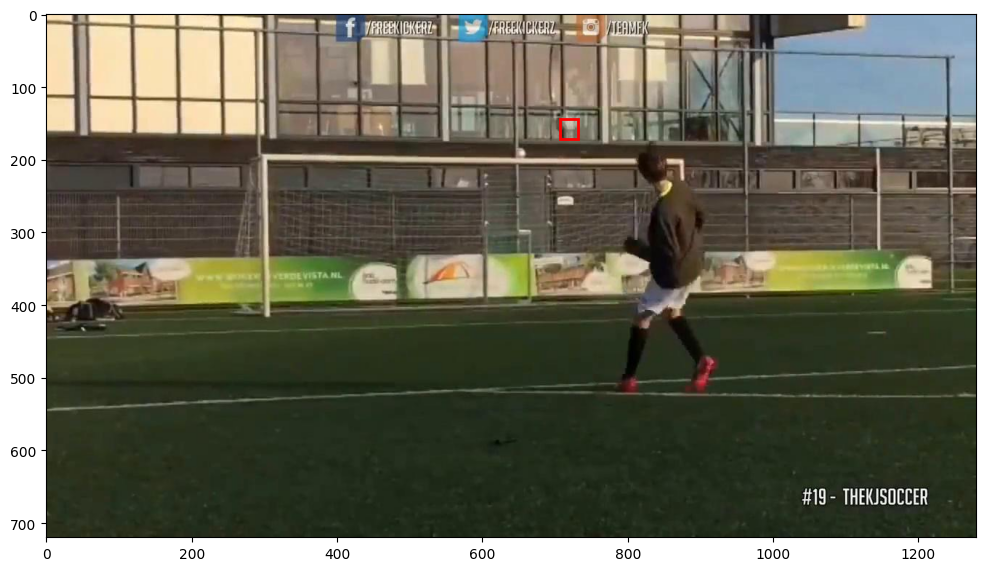

In [50]:
import random
import os
import matplotlib.pyplot as plt
from PIL import Image

test_images_dir = '/kaggle/working/merged_dataset/test/images'

image_files = os.listdir(test_images_dir)

random_images = random.sample(image_files, 20)

for img_file in random_images:
    img_path = os.path.join(test_images_dir, img_file)
    results = model_simple(img_path)
    img = Image.open(img_path)
    
    fig, ax = plt.subplots(1, 1, figsize=(12, 12))
    ax.imshow(img)

    for result in results[0].boxes:
        x1, y1, x2, y2 = result.xyxy[0].cpu().numpy()
        ax.add_patch(plt.Rectangle((x1, y1), x2-x1, y2-y1, fill=False, color='red', linewidth=2))
    
    plt.show()

Вывод:

Таким образом, качество на метрике mAP с порогом 0.5 имеет высокий показатель, при рассмотрении большего значения порога качество ухудшается. При использовании простой аугментации результат получился выше, чем при дополнительном использовании сложных приёмов. 

Визуально на тестовых изображений видно, что действительно в основном мячи детектируются верно. 

Распространённые ошибки: не все мячи были детектированы, были детектированы некие круглые формы, не являющиеся мячами, скопление мячей не детектируется. Возможные пути решения: эксперимент  различными аугментациями, добавление разнообразных данных для обучения, настройка гиперпараметров. 